## 第二章 数据探索与可视化

In [1]:
## 输出高清图像
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
## 图像显示中文的问题
import matplotlib
matplotlib.rcParams['axes.unicode_minus']=False

import seaborn as sns 
sns.set(font= "Kaiti",style="ticks",font_scale=1.4)

In [2]:
## 导入本小节会使用到的库
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import missingno as msno 
import altair as alt
from statsmodels.graphics.mosaicplot import mosaic
from scipy.stats import chi2_contingency
import plotly.express as px
from pandas.plotting import parallel_coordinates
from wordcloud import WordCloud
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
from scipy.spatial import distance

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from missingpy import MissForest    # missingpy库比较旧，可能需要版本较低的scikit-learn==0.22.1

## 忽略提醒
import warnings
warnings.filterwarnings("ignore")

/Users/daitu/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


### 2.1 缺失值处理

#### 2.1.1 简单缺失值处理方法

发现、剔除、缺失值填充等


In [3]:
## 读取用于演示的数据集
oceandf = pd.read_csv("data/chap2/热带大气海洋数据.csv")
## 判断每个变量中是否存在缺失值
pd.isna(oceandf).sum()

Year               0
Latitude           0
Longitude          0
SeaSurfaceTemp     3
AirTemp           81
Humidity          93
UWind              0
VWind              0
dtype: int64

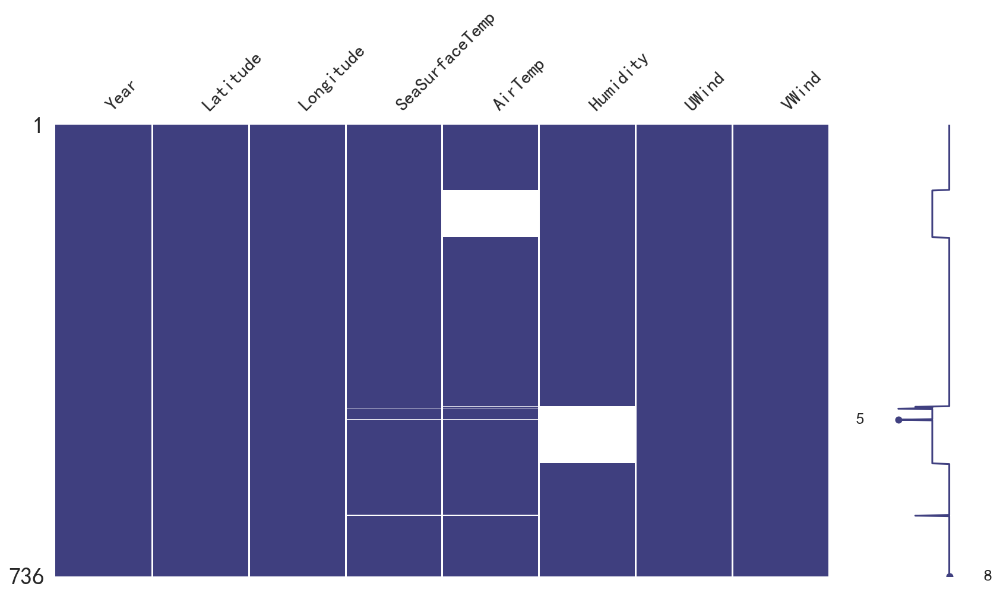

In [4]:
## 使用可视化方法查看缺失值子在数据中的分布
msno.matrix(oceandf,figsize=(14, 7),width_ratios=(13, 2),color=(0.25, 0.25, 0.5))
plt.show()

右侧的迷你图概述了数据完整性的一般形状，并指出了数据集中具有最大和最小有效值的行。（如5表示对应的行有三个变量是缺失的，5个变量是完整的。）

#### 缺失值处理的相关方法

1: 剔除带有缺失值的行或列


In [5]:
## 剔除带有缺失值的行
oceandf2 = oceandf.dropna(axis=0)
oceandf2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 565 entries, 0 to 735
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Year            565 non-null    int64  
 1   Latitude        565 non-null    int64  
 2   Longitude       565 non-null    int64  
 3   SeaSurfaceTemp  565 non-null    float64
 4   AirTemp         565 non-null    float64
 5   Humidity        565 non-null    float64
 6   UWind           565 non-null    float64
 7   VWind           565 non-null    float64
dtypes: float64(5), int64(3)
memory usage: 39.7 KB


In [6]:
## 剔除带有缺失值的列
oceandf3 = oceandf.dropna(axis=1)
oceandf3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Year       736 non-null    int64  
 1   Latitude   736 non-null    int64  
 2   Longitude  736 non-null    int64  
 3   UWind      736 non-null    float64
 4   VWind      736 non-null    float64
dtypes: float64(2), int64(3)
memory usage: 28.9 KB


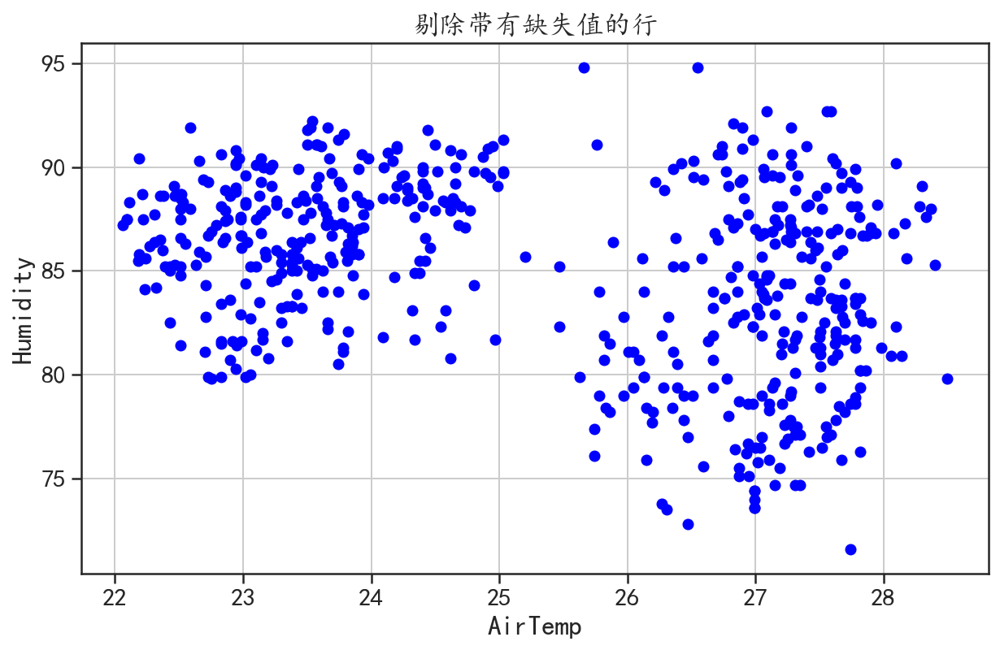

In [7]:
## 使用其它数据进行缺失值插补

## 可视化删除缺失值所在行后AirTemp和Humidity变量的数据分布散点图
plt.figure(figsize = (10,6))
plt.scatter(oceandf.AirTemp,oceandf.Humidity,c = "blue")
plt.grid()
plt.xlabel("AirTemp")
plt.ylabel("Humidity")
plt.title("剔除带有缺失值的行")
plt.show()


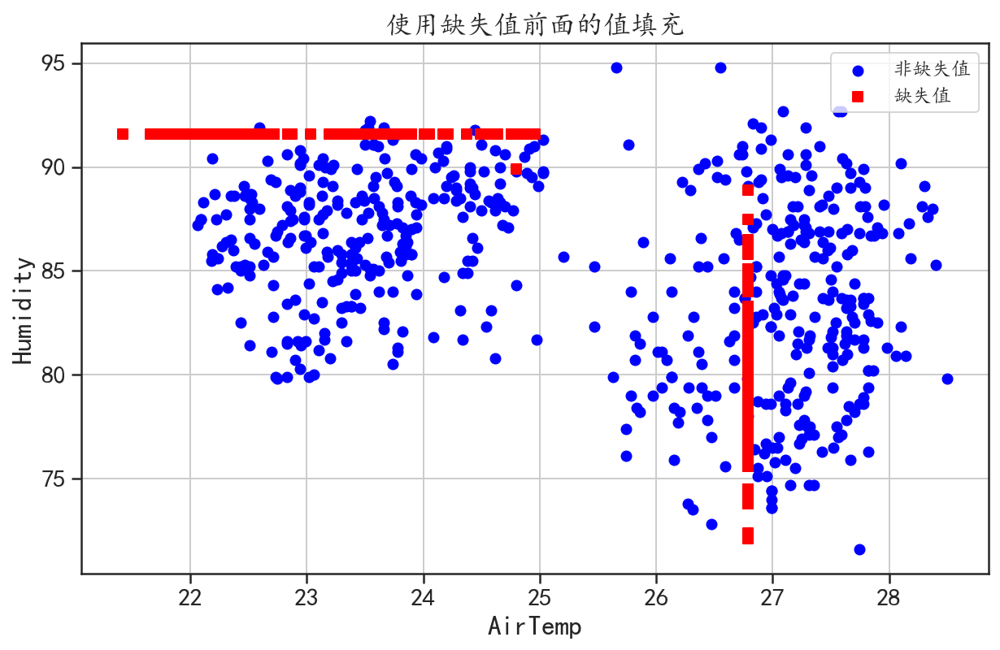

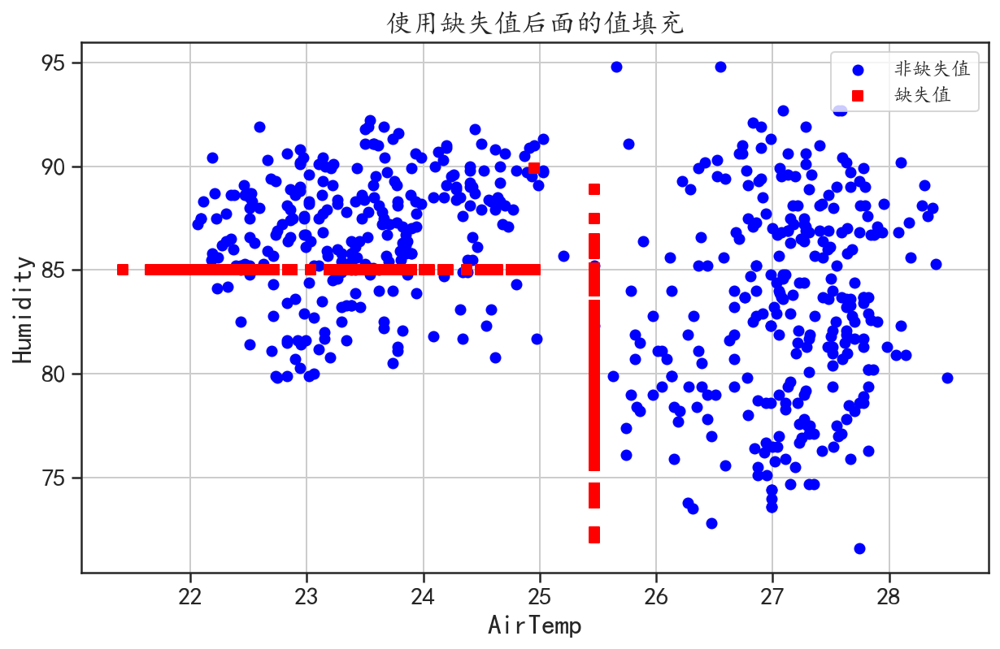

In [8]:
## 分别使用均值进行缺失值填充
## 找到缺失值所在的位置
nanaindex = pd.isna(oceandf.AirTemp) | pd.isna(oceandf.Humidity)

## 对使用缺失值前面的值进行填充
oceandf4 = oceandf.fillna(axis = 0,method = "ffill")
## 可视化填充后的结果
plt.figure(figsize = (10,6))
plt.scatter(oceandf4.AirTemp[~nanaindex],oceandf4.Humidity[~nanaindex],
            c = "blue",marker = "o",label = "非缺失值")
plt.scatter(oceandf4.AirTemp[nanaindex],oceandf4.Humidity[nanaindex],
            c = "red",marker = "s",label = "缺失值")
plt.grid()
plt.legend(loc = "upper right",fontsize = 12)
plt.xlabel("AirTemp")
plt.ylabel("Humidity")
plt.title("使用缺失值前面的值填充")
plt.show()


## 对使用缺失值后面的值进行填充
oceandf4 = oceandf.fillna(axis = 0,method = "bfill")
## 可视化填充后的结果
plt.figure(figsize = (10,6))
plt.scatter(oceandf4.AirTemp[~nanaindex],oceandf4.Humidity[~nanaindex],
            c = "blue",marker = "o",label = "非缺失值")
plt.scatter(oceandf4.AirTemp[nanaindex],oceandf4.Humidity[nanaindex],
            c = "red",marker = "s",label = "缺失值")
plt.grid()
plt.legend(loc = "upper right",fontsize = 12)
plt.xlabel("AirTemp")
plt.ylabel("Humidity")
plt.title("使用缺失值后面的值填充")
plt.show()

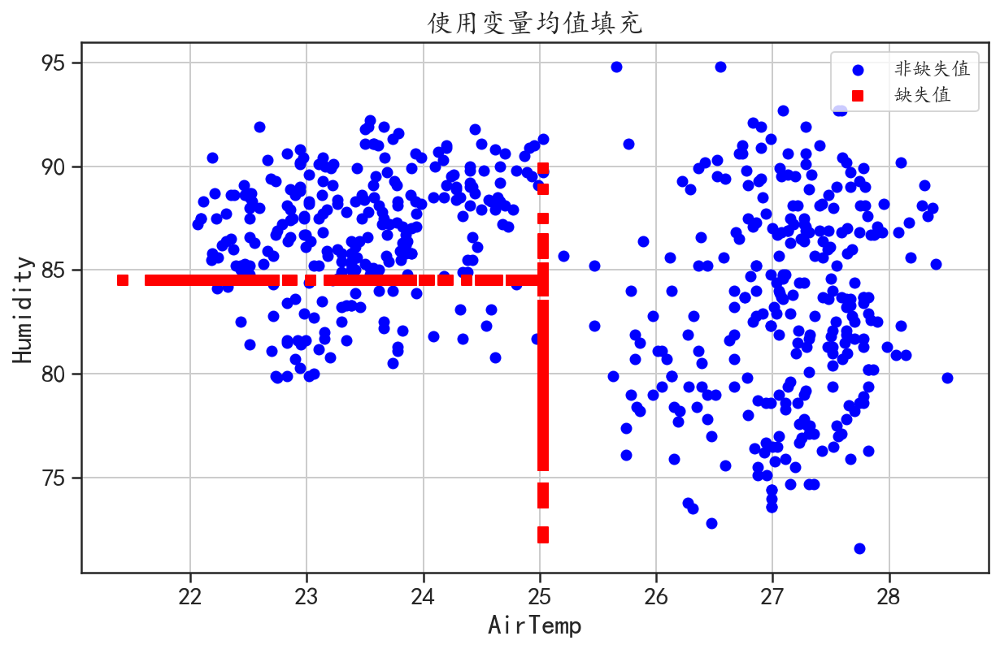

In [9]:
## 找到缺失值所在的位置
nanaindex = pd.isna(oceandf.AirTemp) | pd.isna(oceandf.Humidity)
## 使用变量均值进行填充
AirTempmean = oceandf.AirTemp.mean()
Humiditymean = oceandf4.Humidity.mean()
## 填充
AirTemp = oceandf.AirTemp.fillna(value = AirTempmean)
Humidity = oceandf.Humidity.fillna(value = Humiditymean)
## 可视化填充后的结果
plt.figure(figsize = (10,6))
plt.scatter(AirTemp[~nanaindex],Humidity[~nanaindex],
            c = "blue",marker = "o",label = "非缺失值")
plt.scatter(AirTemp[nanaindex],Humidity[nanaindex],
            c = "red",marker = "s",label = "缺失值")
plt.grid()
plt.legend(loc = "upper right",fontsize = 12)
plt.xlabel("AirTemp")
plt.ylabel("Humidity")
plt.title("使用变量均值填充")
plt.show()

#### 2.1.2 复杂缺失值填补方法 

使用K近邻方法等进行缺失值填充

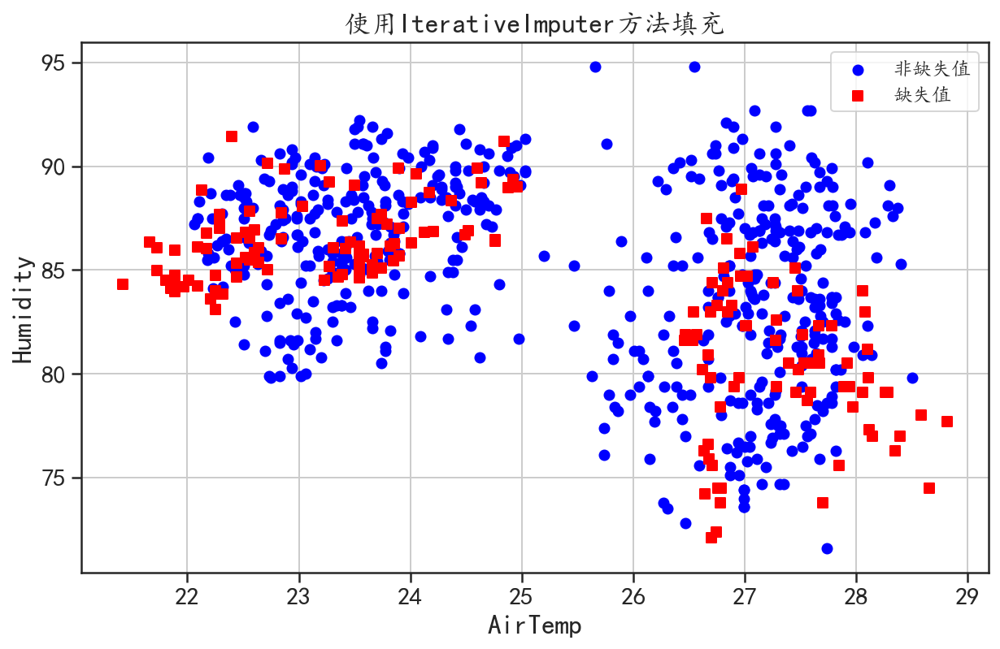

In [10]:
## IterativeImputer多变量缺失值填补方法
iterimp = IterativeImputer(random_state = 123)
oceandfiter = iterimp.fit_transform(oceandf)
## 获取填充后的变量
AirTemp = oceandfiter[:,4]
Humidity = oceandfiter[:,5]
## 可视化填充后的结果
plt.figure(figsize = (10,6))
plt.scatter(AirTemp[~nanaindex],Humidity[~nanaindex],
            c = "blue",marker = "o",label = "非缺失值")
plt.scatter(AirTemp[nanaindex],Humidity[nanaindex],
            c = "red",marker = "s",label = "缺失值")
plt.grid()
plt.legend(loc = "upper right",fontsize = 12)
plt.xlabel("AirTemp")
plt.ylabel("Humidity")
plt.title("使用IterativeImputer方法填充")
plt.show()

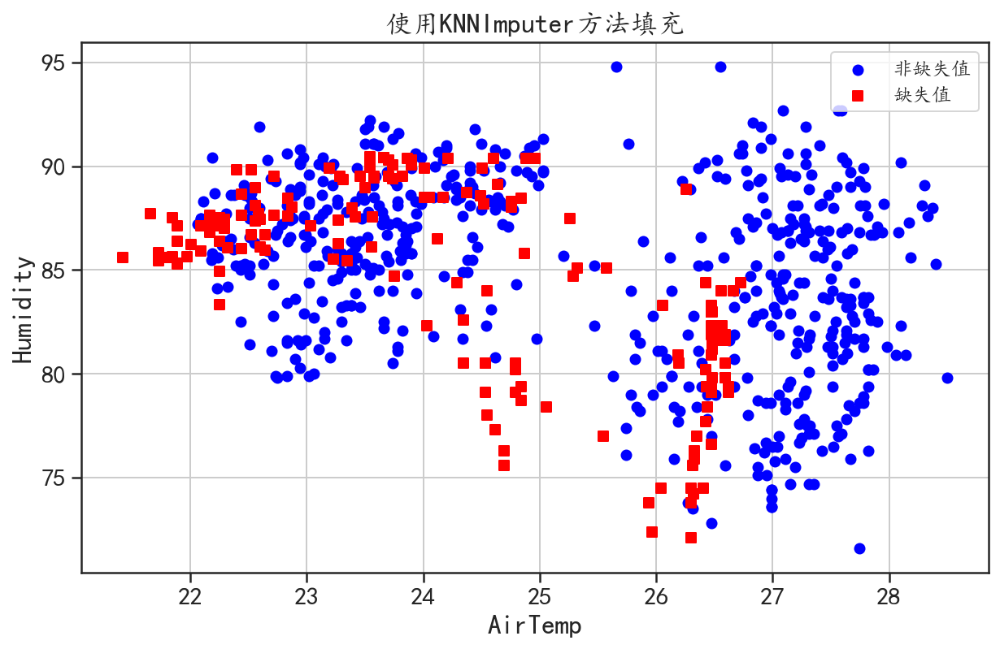

In [11]:
## KNNImputer缺失值填补方法
knnimp = KNNImputer(n_neighbors = 5)
oceandfknn = knnimp.fit_transform(oceandf)
## 获取填充后的变量
AirTemp = oceandfknn[:,4]
Humidity = oceandfknn[:,5]
## 可视化填充后的结果
plt.figure(figsize = (10,6))
plt.scatter(AirTemp[~nanaindex],Humidity[~nanaindex],
            c = "blue",marker = "o",label = "非缺失值")
plt.scatter(AirTemp[nanaindex],Humidity[nanaindex],
            c = "red",marker = "s",label = "缺失值")
plt.grid()
plt.legend(loc = "upper right",fontsize = 12)
plt.xlabel("AirTemp")
plt.ylabel("Humidity")
plt.title("使用KNNImputer方法填充")
plt.show()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4


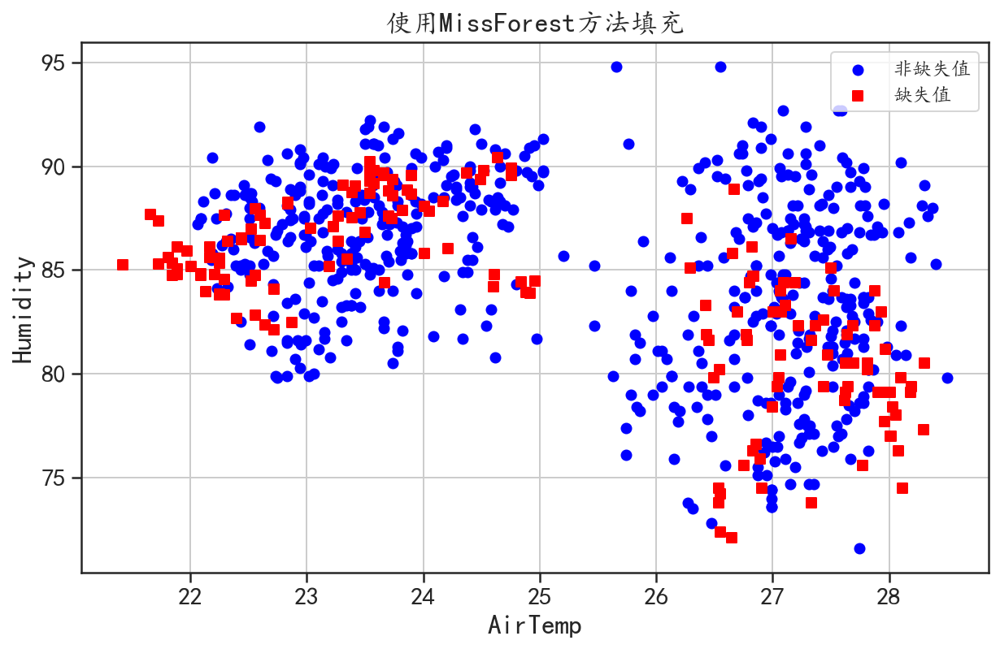

In [12]:
## MissForest缺失值填补方法
forestimp = MissForest(n_estimators = 100,random_state = 123)
oceandfforest = forestimp.fit_transform(oceandf)
## 获取填充后的变量
AirTemp = oceandfforest[:,4]
Humidity = oceandfforest[:,5]
## 可视化填充后的结果
plt.figure(figsize = (10,6))
plt.scatter(AirTemp[~nanaindex],Humidity[~nanaindex],
            c = "blue",marker = "o",label = "非缺失值")
plt.scatter(AirTemp[nanaindex],Humidity[nanaindex],
            c = "red",marker = "s",label = "缺失值")
plt.grid()
plt.legend(loc = "upper right",fontsize = 12)
plt.xlabel("AirTemp")
plt.ylabel("Humidity")
plt.title("使用MissForest方法填充")
plt.show()

### 2.2 数据描述
  
#### 2.2.1 数据描述统计

In [13]:
## 读取鸢尾花数据集
Iris = pd.read_csv("data/chap2/Iris.csv")
Iris2 = Iris.drop(["Id","Species"],axis = 1)
print(Iris2.head())

   SepalLengthCm  SepalWidthCm  PetalLengthCm  PetalWidthCm
0            5.1           3.5            1.4           0.2
1            4.9           3.0            1.4           0.2
2            4.7           3.2            1.3           0.2
3            4.6           3.1            1.5           0.2
4            5.0           3.6            1.4           0.2


In [14]:
## 均值
print("均值:\n",Iris2.mean())
## 中位数
print("中位数:\n",Iris2.median())
## 众数
print("众数:\n",Iris2.mode())

均值:
 SepalLengthCm    5.843333
SepalWidthCm     3.054000
PetalLengthCm    3.758667
PetalWidthCm     1.198667
dtype: float64
中位数:
 SepalLengthCm    5.80
SepalWidthCm     3.00
PetalLengthCm    4.35
PetalWidthCm     1.30
dtype: float64
众数:
    SepalLengthCm  SepalWidthCm  PetalLengthCm  PetalWidthCm
0            5.0           3.0            1.5           0.2


In [15]:
## 发散程度

## 极差
print("极差:\n",Iris2.max() - Iris2.min())
## 分位数
print("分位数:\n",Iris2.quantile(q=[0,0.25,0.5,0.75,1]))
## 方差  
print("方差:\n",Iris2.var())

## 标准差
print("标准差:\n",Iris2.std())
## 变异系数
print("变异系数:\n",Iris2.mean() / Iris2.std())

极差:
 SepalLengthCm    3.6
SepalWidthCm     2.4
PetalLengthCm    5.9
PetalWidthCm     2.4
dtype: float64
分位数:
       SepalLengthCm  SepalWidthCm  PetalLengthCm  PetalWidthCm
0.00            4.3           2.0           1.00           0.1
0.25            5.1           2.8           1.60           0.3
0.50            5.8           3.0           4.35           1.3
0.75            6.4           3.3           5.10           1.8
1.00            7.9           4.4           6.90           2.5
方差:
 SepalLengthCm    0.685694
SepalWidthCm     0.188004
PetalLengthCm    3.113179
PetalWidthCm     0.582414
dtype: float64
标准差:
 SepalLengthCm    0.828066
SepalWidthCm     0.433594
PetalLengthCm    1.764420
PetalWidthCm     0.763161
dtype: float64
变异系数:
 SepalLengthCm    7.056602
SepalWidthCm     7.043450
PetalLengthCm    2.130256
PetalWidthCm     1.570661
dtype: float64


In [16]:
## 偏度和峰度
## 偏度
print("偏度:\n",Iris2.skew())

## 峰度
print("峰度:\n",Iris2.kurtosis())

偏度:
 SepalLengthCm    0.314911
SepalWidthCm     0.334053
PetalLengthCm   -0.274464
PetalWidthCm    -0.104997
dtype: float64
峰度:
 SepalLengthCm   -0.552064
SepalWidthCm     0.290781
PetalLengthCm   -1.401921
PetalWidthCm    -1.339754
dtype: float64


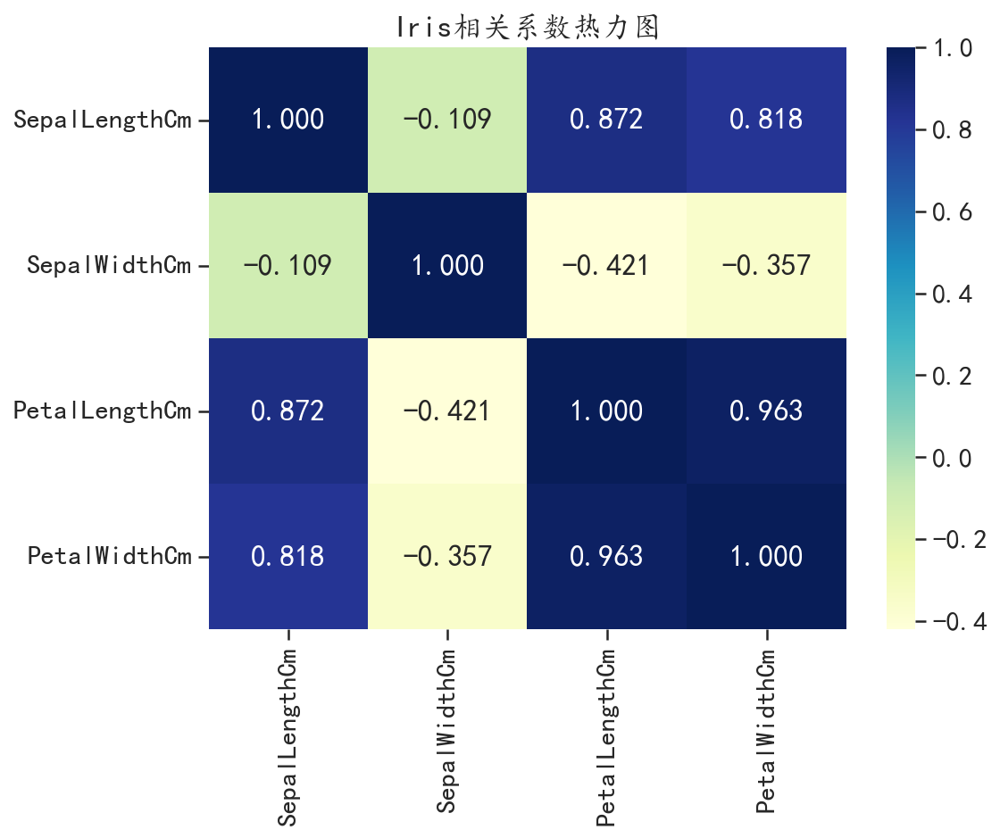

In [17]:
## 相关系数
iriscorr = Iris2.corr(method="pearson")
## 使用热力图可视化
plt.figure(figsize=(8,6))
ax = sns.heatmap(iriscorr,fmt=".3f",annot=True,cmap="YlGnBu")
## y轴标签居中
ax.set_yticklabels(iriscorr.index.values,va="center")
plt.title("Iris相关系数热力图")
plt.show()

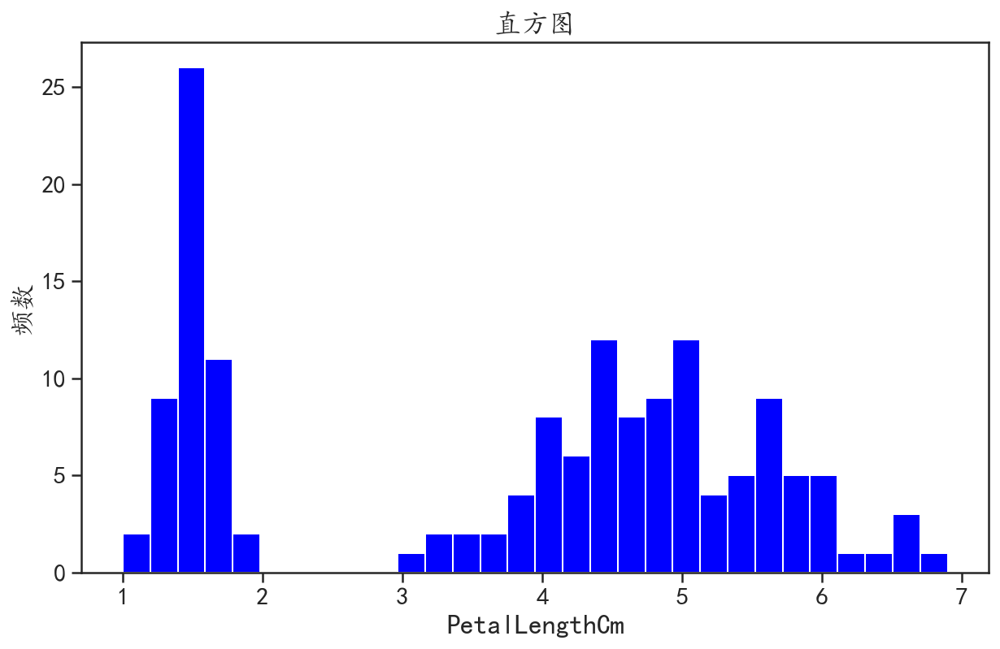

In [18]:
## 单个数据变量的分布情况

## 数值变量直方图可视化
plt.figure(figsize=(10,6))
plt.hist(Iris2.PetalLengthCm,bins = 30,color = "blue")
plt.xlabel("PetalLengthCm")
plt.ylabel("频数",)
plt.title("直方图")
plt.show()


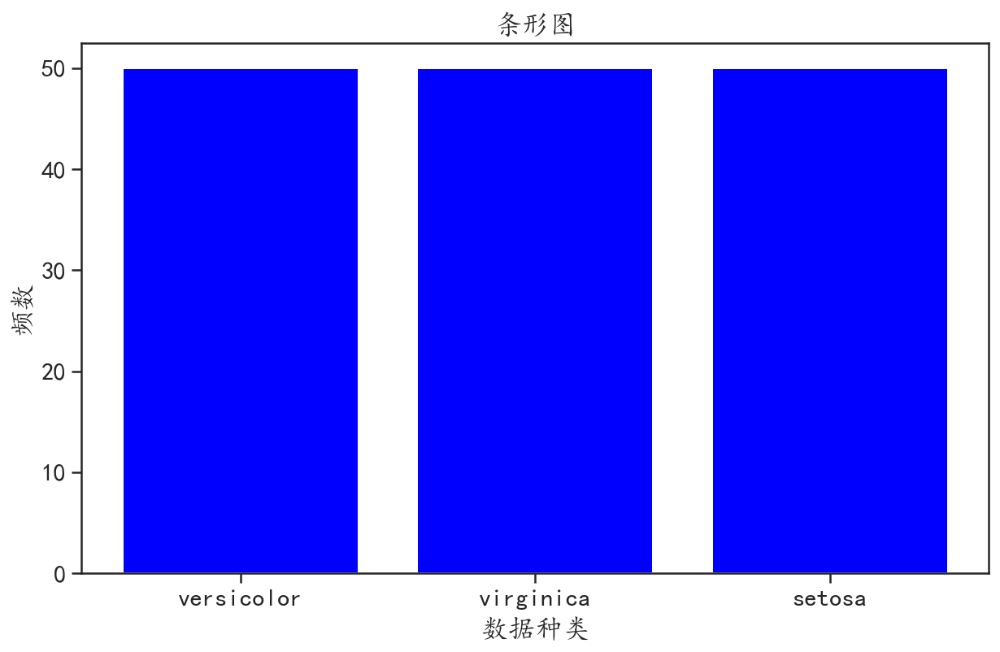

In [19]:
## 分类变量条形图可视化
plotdata = Iris.Species.value_counts()
plt.figure(figsize=(10,6))
plt.bar(x = plotdata.index.values,height=plotdata.values ,color = "blue")
plt.xlabel("数据种类")
plt.ylabel("频数")
plt.title("条形图")
plt.show()

#### 2.2.2 异常值基础处理方法


In [20]:
## 使用KNN填充后的oceandfknn后5个变量演示
oceandfknn5 = pd.DataFrame(data = oceandfknn[:,3:8],
                           columns=["SeaSurfaceTemp", "AirTemp",
                                    "Humidity", "UWind", "VWind"])
print(oceandfknn5.head())

   SeaSurfaceTemp  AirTemp  Humidity  UWind  VWind
0           27.59    27.15      79.6   -6.4    5.4
1           27.55    27.02      75.8   -5.3    5.3
2           27.57    27.00      76.5   -5.1    4.5
3           27.62    26.93      76.2   -4.9    2.5
4           27.65    26.84      76.4   -3.5    4.1


In [21]:
## 发现异常值

## 根据3sigma法则，超出均值3被标准差之外的数据可认为是异常值
oceandfknn5mean = oceandfknn5.mean()
oceandfknn5mean 
oceandfknn5std = oceandfknn5.std()
## 计算对应的样本是否为异常值
outliers = abs(oceandfknn5 - oceandfknn5mean) > 3 * oceandfknn5std
## 计算每个变量有多少异常值
outliers.sum()

## 使用该方法可发现只有UWind变量有6个异常值

SeaSurfaceTemp     0
AirTemp            0
Humidity           0
UWind              6
VWind             10
dtype: int64

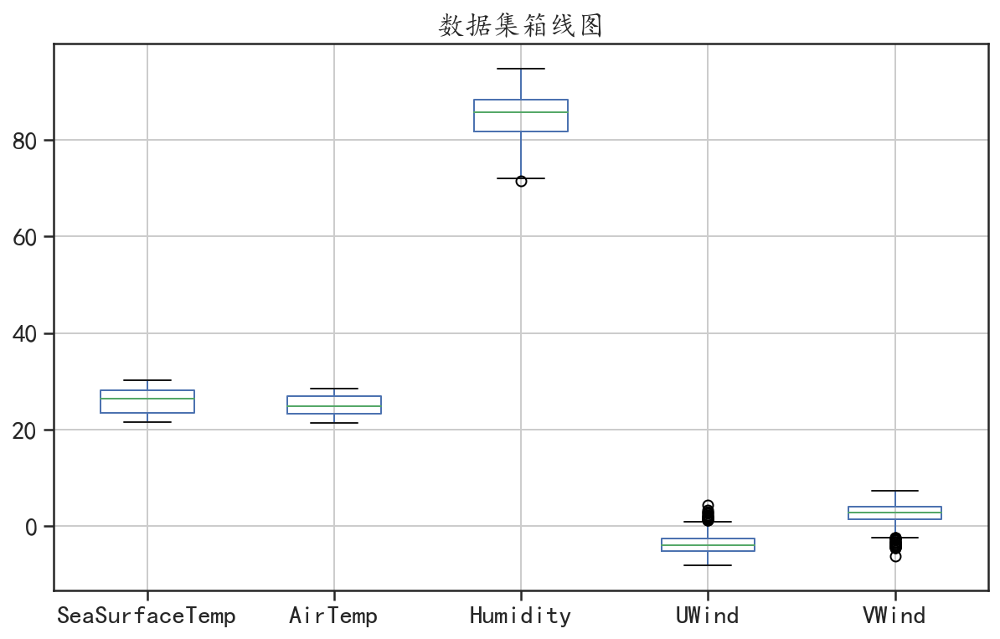

In [22]:
## 发现异常值

## 使用箱线图分析数据中是否存在异常值
oceandfknn5.plot(kind = "box",figsize=(10,6))
plt.title("数据集箱线图")
plt.grid()
plt.show()

## 可以发现Humidity又一个异常值，UWind和VWind有多个异常值

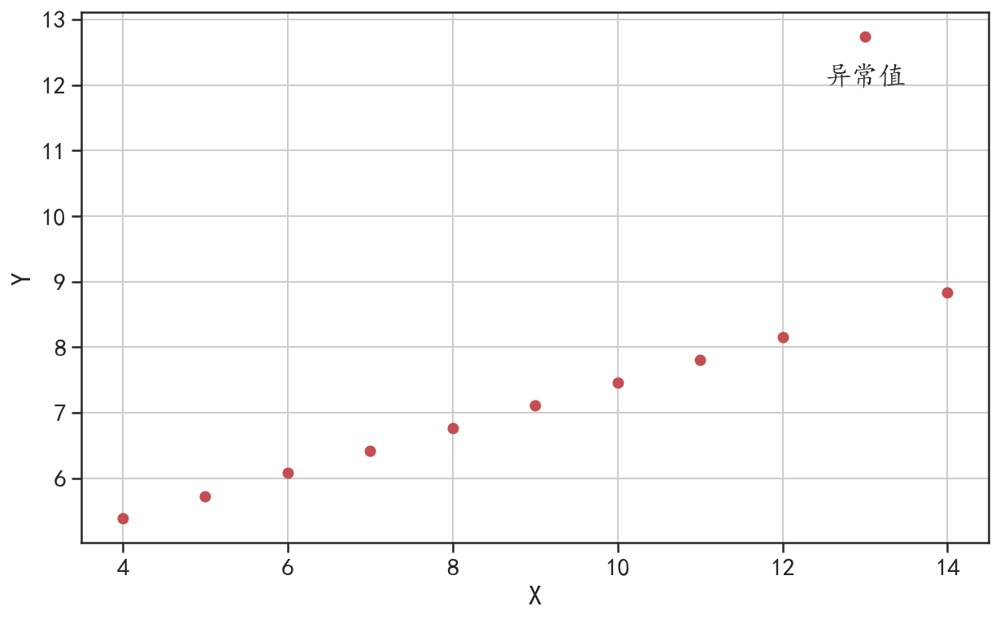

In [23]:
## 针对两个变量可以使用散点图分析数据中是否有异常值
x = [10,8,13,9,11,14,6,4,12,7,5]
y = [7.46,6.77,12.74,7.11,7.81,8.84,6.08,5.39,8.15,6.42,5.73]

## 使用散点图进行可视化
plt.figure(figsize = (10,6))
plt.plot(x,y,"ro")
plt.grid()
plt.xlabel("X")
plt.ylabel("Y")
plt.text(12.5,12,"异常值")
plt.show()


In [24]:
## 针对发现的异常值可以进行删除操作


### 2.3 数据关系与可视化分析

#### 2.3.1 数值变量

In [24]:
## 读取鸢尾花数据集
Iris = pd.read_csv("data/chap2/Iris.csv")
Iris2 = Iris.drop(["Id","Species"],axis = 1)
print(Iris2.head())

   SepalLengthCm  SepalWidthCm  PetalLengthCm  PetalWidthCm
0            5.1           3.5            1.4           0.2
1            4.9           3.0            1.4           0.2
2            4.7           3.2            1.3           0.2
3            4.6           3.1            1.5           0.2
4            5.0           3.6            1.4           0.2


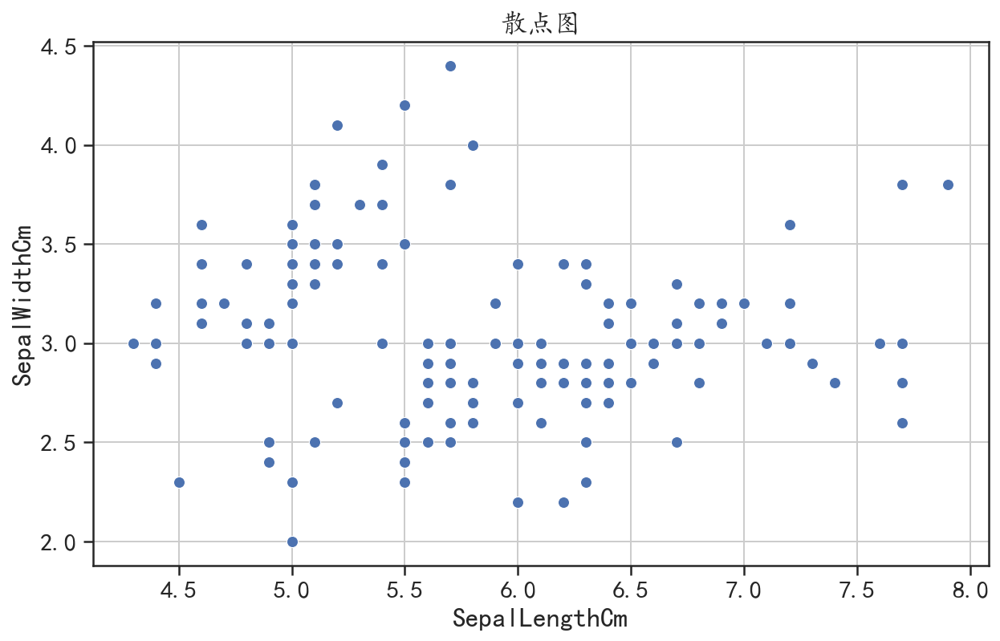

In [25]:
## 两个数值变量之间的可视化

## 散点图
plt.figure(figsize = (10,6))
sns.scatterplot(x = "SepalLengthCm",y = "SepalWidthCm",data = Iris2,s = 50)
plt.title("散点图")
plt.grid()
plt.show()

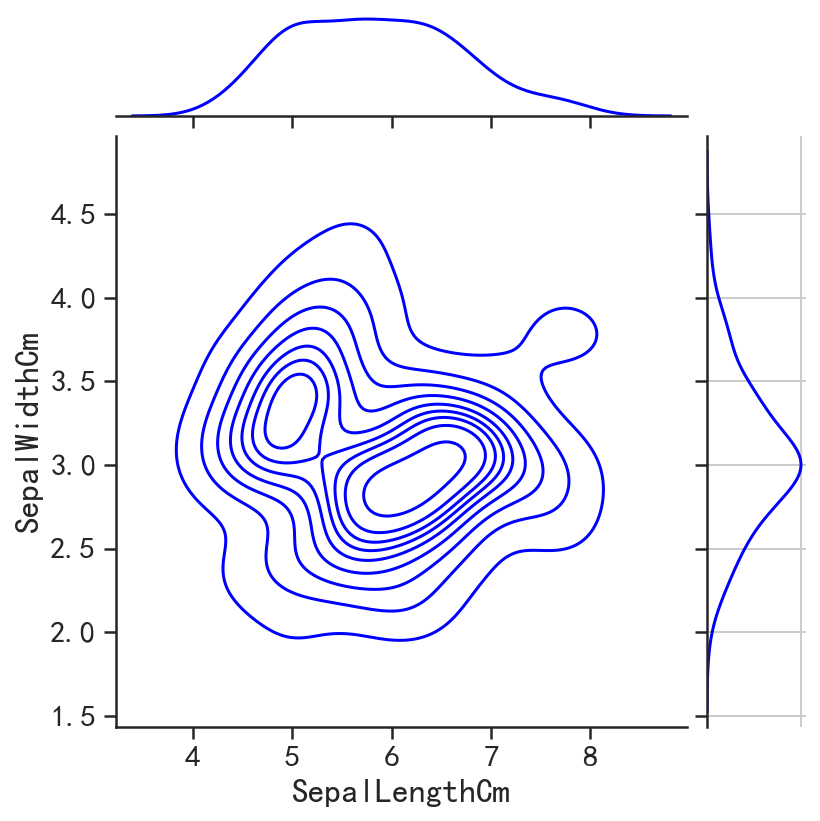

In [26]:
## 2D密度曲线
# plt.figure(figsize = (10,6))
sns.jointplot(x = "SepalLengthCm",y = "SepalWidthCm",data = Iris2,
              kind="kde",color = "blue")
plt.grid()
plt.show()


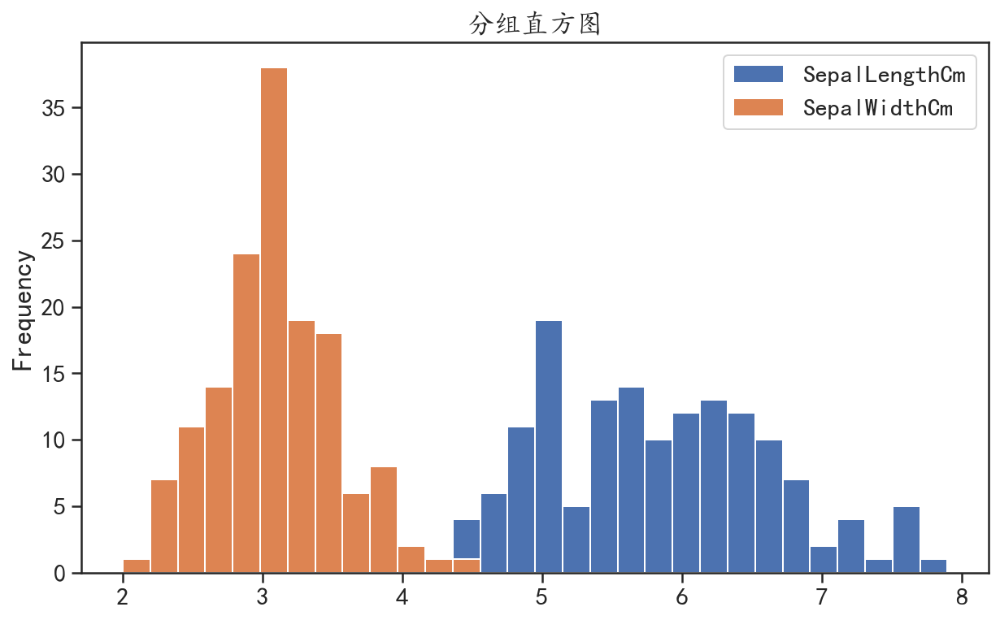

In [27]:
## 直方图
Iris2.iloc[:,0:2].plot(kind = "hist",bins = 30,figsize = (10,6))
plt.title("分组直方图")
plt.show()

##### 多个数值变量之间的可视化

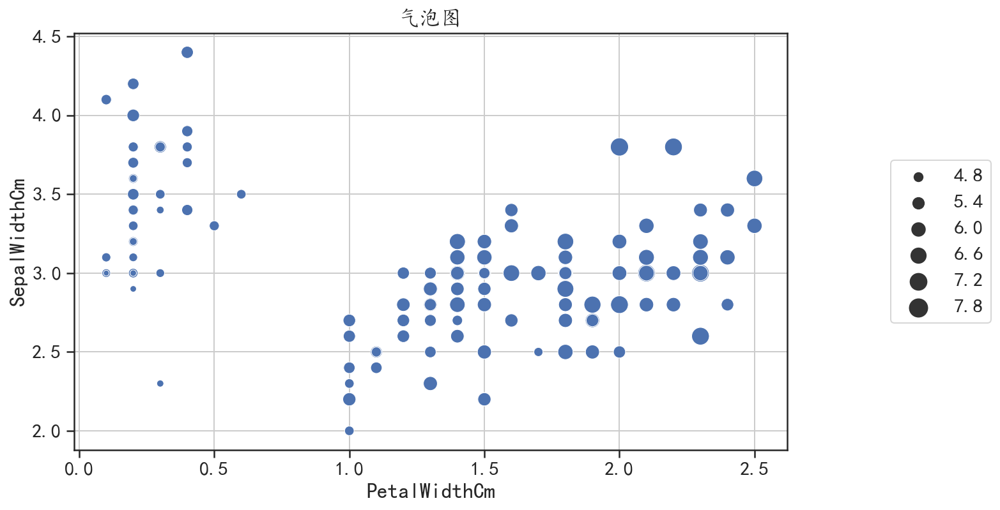

In [28]:
## 气泡散点图
plt.figure(figsize = (10,6))
sns.scatterplot(x = "PetalWidthCm",y = "SepalWidthCm",data = Iris2,
                size = "SepalLengthCm",sizes = (20,200),palette="muted")
plt.title("气泡图")
plt.legend(loc="center right",bbox_to_anchor=(1.3, 0.5))
plt.grid()
plt.show()

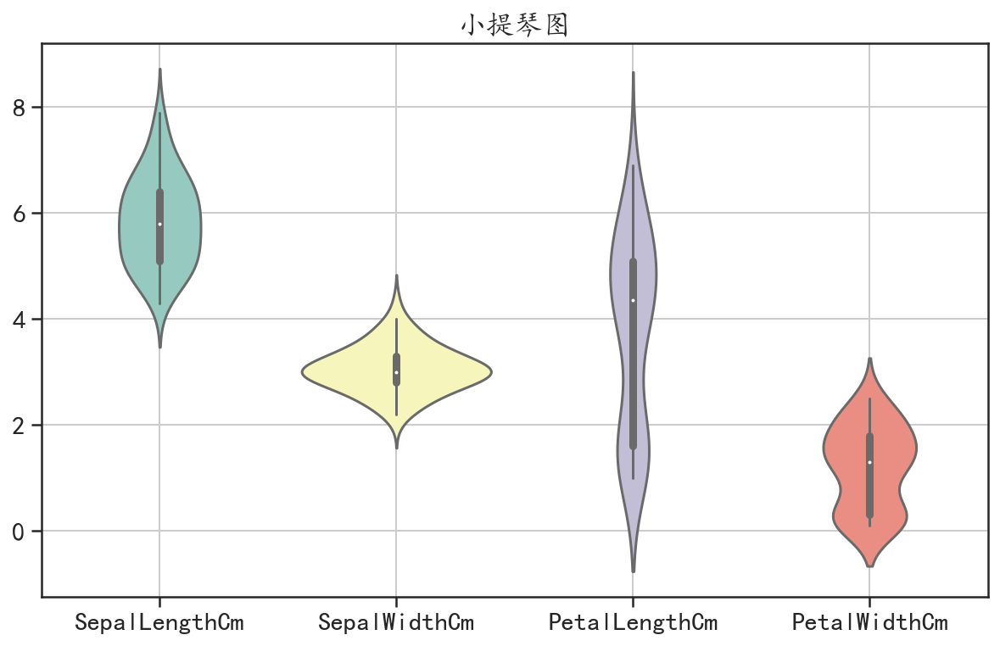

In [29]:
## 使用小提琴图分析数据取值上的差异
plt.figure(figsize = (10,6))
sns.violinplot(data=Iris2.iloc[:,0:4], palette="Set3", bw=0.5,)
plt.title("小提琴图")
plt.grid()
plt.show()

In [31]:
## 蒸汽图

## 将鸢尾花宽数据转化为长数据
Irislong = Iris.melt(["Id","Species"], var_name="Measurement_type",
                     value_name="value")
print(Irislong.head())

## 使用蒸汽图可视化
alt.Chart(Irislong).mark_area().encode(
    alt.X("Id:Q"),                              ## X轴
    alt.Y("value:Q", stack="center",axis=None), ## Y轴
    alt.Color('Measurement_type:N'),            ## 设置颜色
).properties(width=500,height=300)    # 设置图形大小

   Id Species Measurement_type  value
0   1  setosa    SepalLengthCm    5.1
1   2  setosa    SepalLengthCm    4.9
2   3  setosa    SepalLengthCm    4.7
3   4  setosa    SepalLengthCm    4.6
4   5  setosa    SepalLengthCm    5.0


alt.Chart(...)

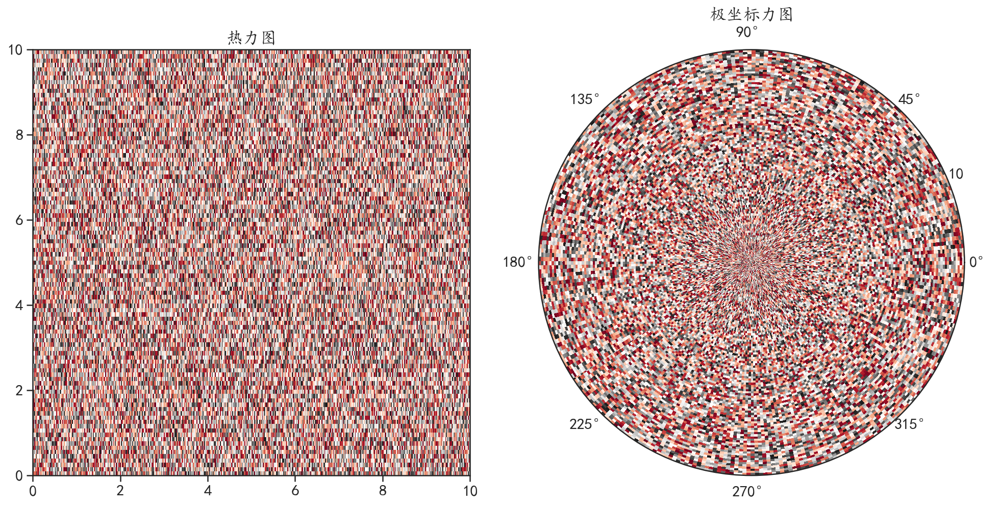

In [32]:
## 热力图
## 数据准备
x = np.linspace(0, 10, 500)  # len = 100
y = np.linspace(0, 10, 100)  # len = 20
Z = np.random.rand(100,500)

## 可视化图像
fig = plt.figure(figsize=(14,7))
ax = fig.add_subplot(121)  ## 热力图
ax.pcolormesh(x, y, Z,cmap = plt.cm.RdGy)
plt.title("热力图")

ax = fig.add_subplot(122, polar=True)  ## 极坐标热力图
ax.pcolormesh(x, y, Z,cmap = plt.cm.RdGy)
plt.title("极坐标力图")
plt.tight_layout()
plt.show()

####  2.3.2 分类变量

In [33]:
## 读取使用的数据
Titanic = pd.read_csv("data/chap2/Titanic数据.csv")
print(Titanic.head())

   Pclass   Name     Sex   Age  SibSp  Parch     Fare Embarked  Survived
0       3    Mr.    male  22.0      1      0   7.2500        S         0
1       1   Mrs.  female  38.0      1      0  71.2833        C         1
2       3  Miss.  female  26.0      0      0   7.9250        S         1
3       1   Mrs.  female  35.0      1      0  53.1000        S         1
4       3    Mr.    male  35.0      0      0   8.0500        S         0


In [34]:
## 两个分类变量

## 分析变量Embarked和Survived的关系

## 卡方检验
tab = pd.crosstab(Titanic["Embarked"], Titanic["Survived"])
print(tab)

c,p,_,_= chi2_contingency(tab.values)
print("卡方值 : ", c, ";  P value : ",p)
## P值远小于0.05，说明两个变量是不独立的

Survived    0    1
Embarked          
C          75   93
Q          47   30
S         427  219
卡方值 :  25.964452881874784 ;  P value :  2.3008626481449577e-06


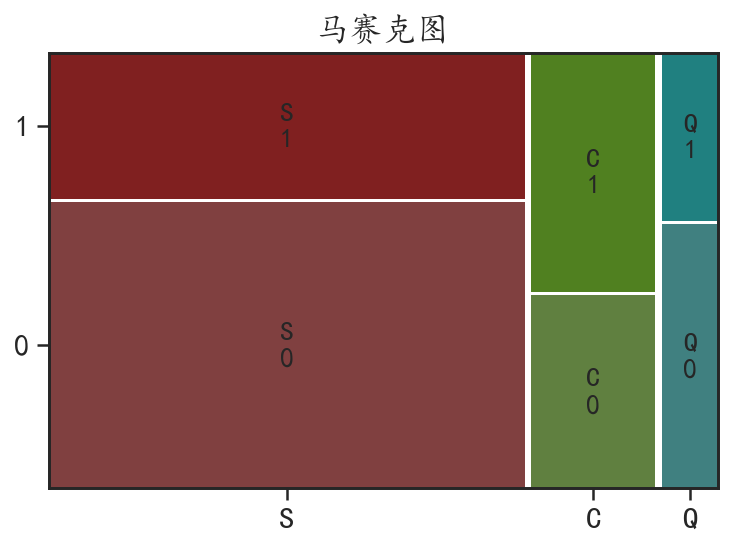

In [35]:
## 马赛克图
mosaic(Titanic,["Embarked","Survived"],gap=0.01,
       title = "马赛克图")
plt.show()


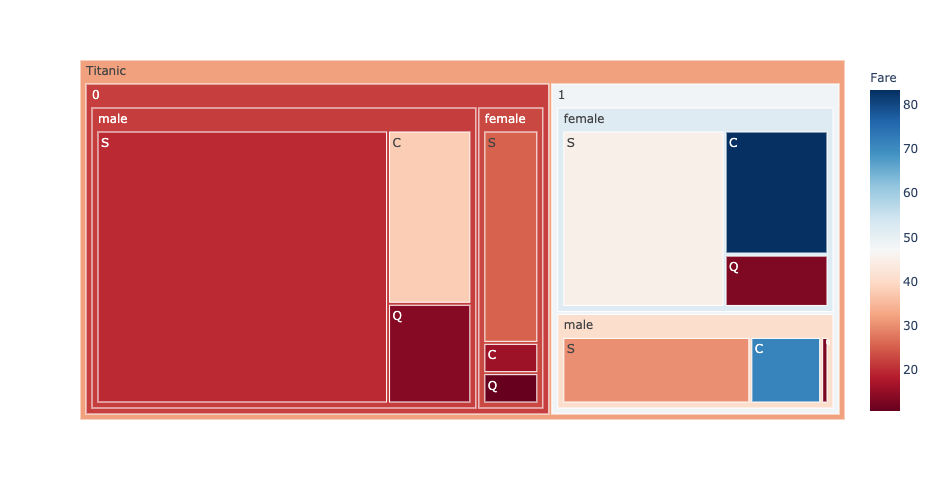

In [36]:
## 多个分类变量

## 树图
Titanic["Titanic"] = "Titanic"    ## 添加一个统一的根
Titanic["value"] = 1              ## 添加一个用于计数的变量
fig = px.treemap(Titanic, path=["Titanic","Survived", "Sex", "Embarked"],
                 values="value", color="Fare",
                 color_continuous_scale='RdBu',
                 width=800,height=500,)
fig.show()

## 从可视化的结果中可以发现，遇难的数量明显多于幸存者，并且票价低的乘客更容易牺牲；
## 在牺牲的人员中男性远远多余女性；幸存的人员中，女性远远多于男性


## 注意在使用plotly包进行可视化，需要在jupyter lab 中添加两个拓展应用
# $ jupyter labextension install jupyterlab-plotly
# $ jupyter labextension install plotlywidget


#### 2.3.3 数值变量和分类变量

In [37]:
print(Irislong.head())

   Id Species Measurement_type  value
0   1  setosa    SepalLengthCm    5.1
1   2  setosa    SepalLengthCm    4.9
2   3  setosa    SepalLengthCm    4.7
3   4  setosa    SepalLengthCm    4.6
4   5  setosa    SepalLengthCm    5.0


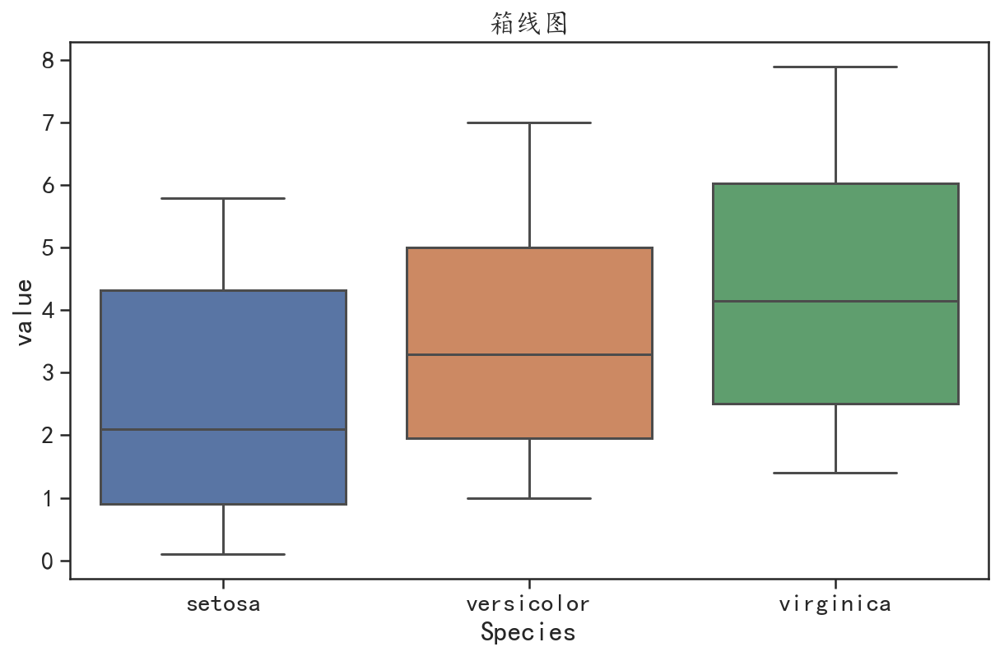

In [38]:
## 一个分类变量一个数值变量

## 分组箱线图
plt.figure(figsize=(10,6))
sns.boxplot(data = Irislong,x = "Species",y = "value")
plt.title("箱线图")
plt.show()


In [39]:
## 分面密度曲线查看数据的分布
alt.Chart(Irislong).transform_density(
    density="value",bandwidth=0.3,
    groupby=["Measurement_type"],extent= [0, 8]
).mark_area().encode(
    alt.X("value:Q"),alt.Y("density:Q"),
    alt.Row("Measurement_type:N")
).properties(width=500,height=80)    # 设置图形大小


alt.Chart(...)

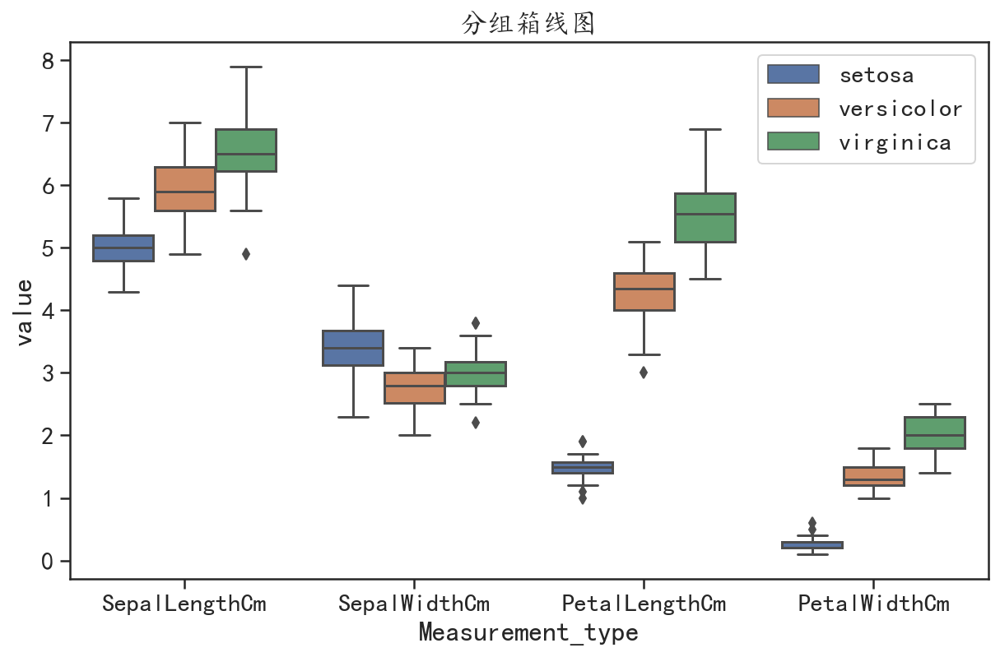

In [40]:
## 2个分类变量一个数值变量

## 分组箱线图
plt.figure(figsize=(10,6))
sns.boxplot(data = Irislong,x = "Measurement_type",y = "value",hue = "Species")
plt.legend(loc = 1)
plt.title("分组箱线图")
plt.show()


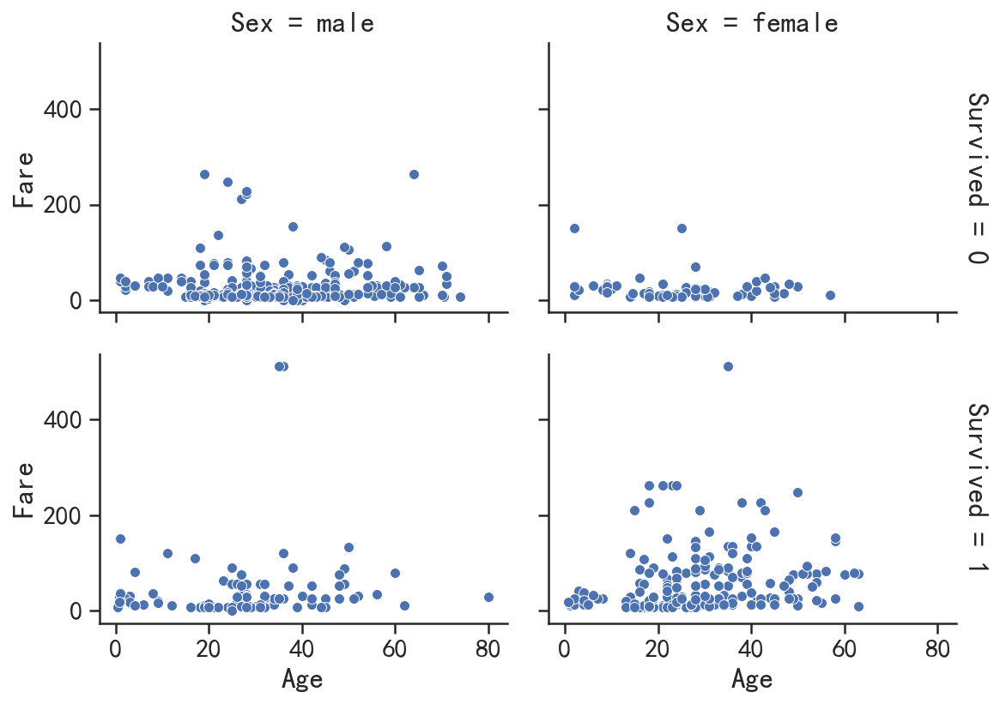

In [41]:
## 2个分类变量2个数值变量
## 分面散点图
## 设置网格分面
g = sns.FacetGrid(data = Titanic,row="Survived",col="Sex",
                  margin_titles=True,height=3,aspect=1.4)
## 添加散点图
g.map(sns.scatterplot,"Age" ,"Fare",)
plt.show()


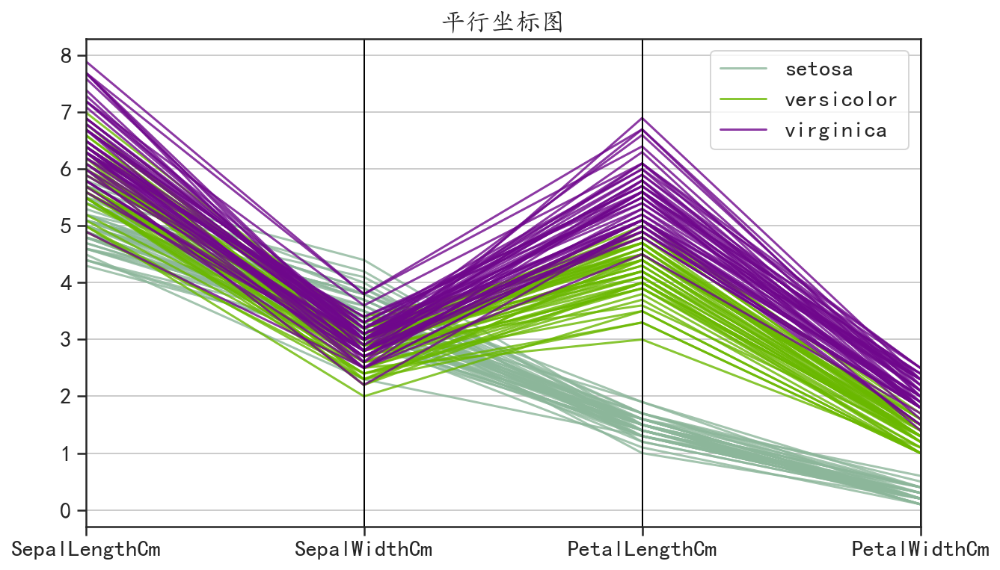

In [42]:
## 一个分类变量多个数值变量

## 平行坐标图
plt.figure(figsize=(10,6))
parallel_coordinates(Iris.iloc[:,1:6], "Species",alpha = 0.8)
plt.title("平行坐标图")
plt.show()


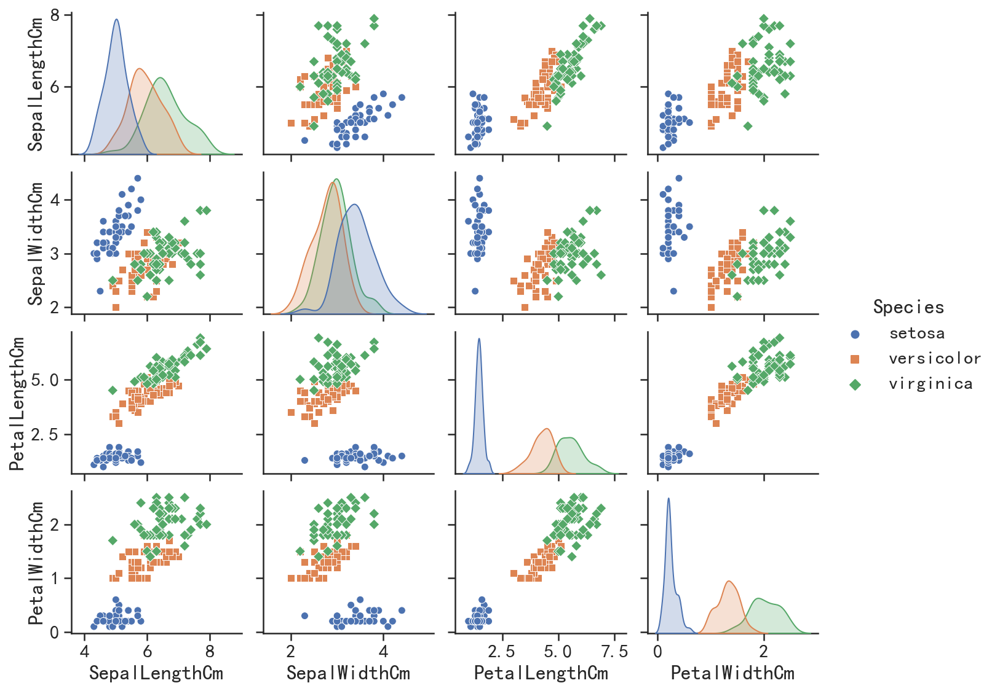

In [43]:
## 矩阵散点图
sns.pairplot(Iris.iloc[:,1:6],hue="Species",height=2,aspect=1.2,
             diag_kind="kde",markers=["o", "s", "D"])
plt.show()


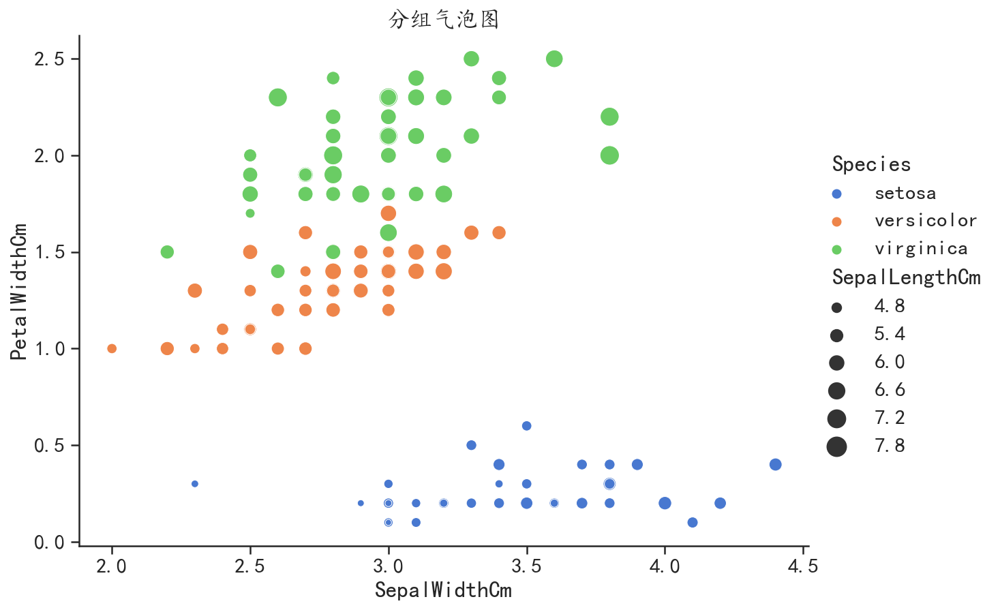

In [44]:
## 分组气泡图
# plt.figure(figsize=(10,6))
sns.relplot(data = Iris, x="SepalWidthCm", y="PetalWidthCm", 
            hue="Species", size = "SepalLengthCm",sizes = (20,200),
            palette="muted",height=6,aspect = 1.4)
plt.title("分组气泡图")
plt.show()


#### 2.3.4 其它类型数据

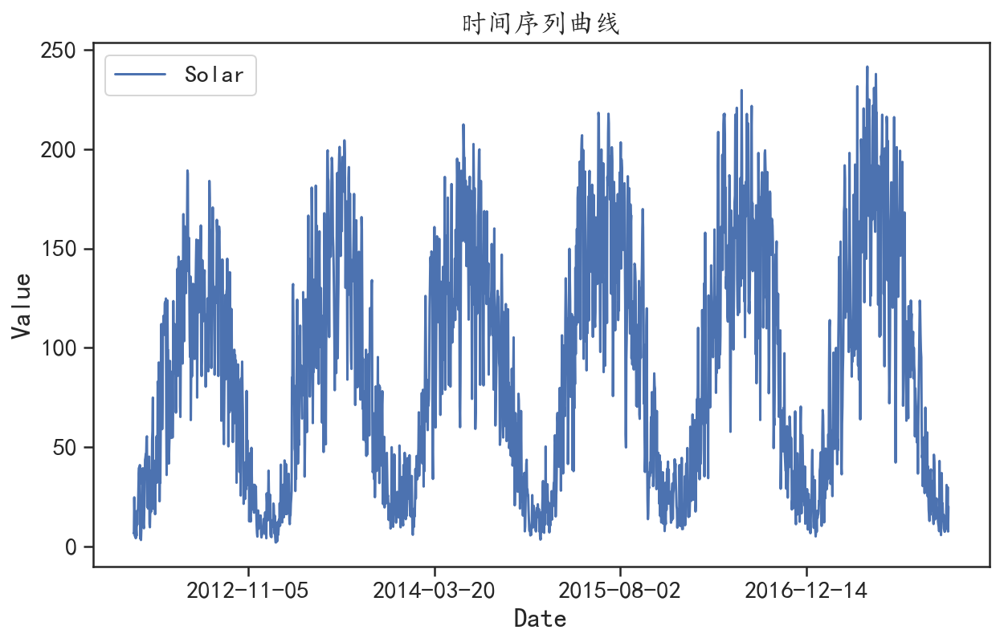

In [45]:
## 时间序列数据
opsd = pd.read_csv("data/chap2/OpenPowerSystemData.csv")
opsd.head()
## 折线图
opsd.plot(kind = "line",x = "Date",y = "Solar",figsize = (10,6))
plt.ylabel("Value")
plt.title("时间序列曲线")
plt.show()

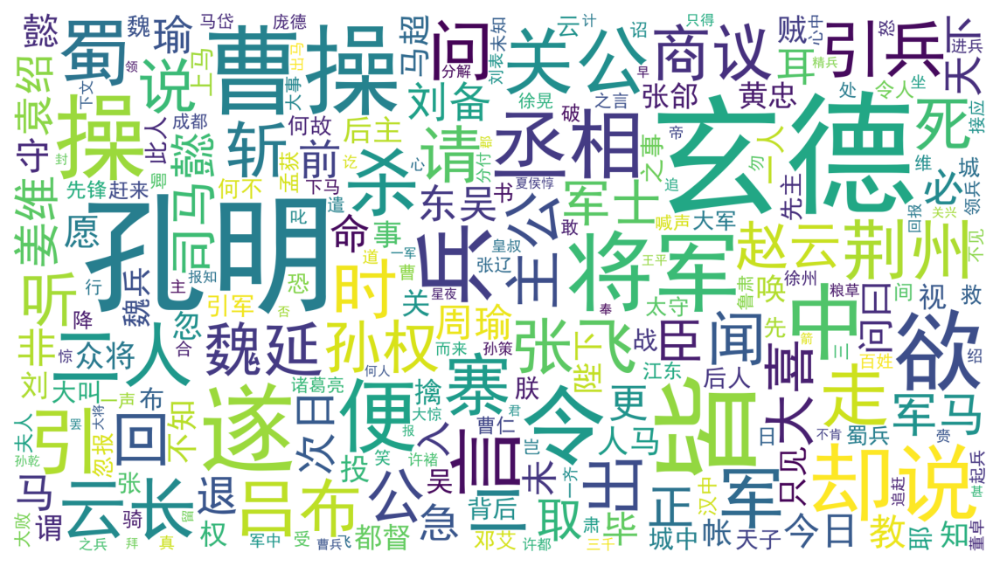

In [46]:
## 文本数据
## 词云可视化

## 准备数据
TKing = pd.read_csv("data/chap2/三国演义分词后.csv")
## 计算每个词语出现的频次
TK_fre = TKing.x.value_counts()
TK_fre = pd.DataFrame({"word":TK_fre.index,
                       "Freq":TK_fre.values})
## 去除出现次数较少的词语
TK_fre = TK_fre[TK_fre.Freq > 100]
TK_fre
## 可视化词云
## 将词和词频组成字典数据准备
worddict = {}
for key,value in zip(TK_fre.word,TK_fre.Freq):
    worddict[key] = value  
## 生成词云
redcold = WordCloud(font_path="/Library/Fonts/Microsoft/SimHei.ttf",
                    margin=5,width=1800, height=1000,
                    max_words=400, min_font_size=5, 
                    background_color='white',
                    max_font_size=250,)
redcold.generate_from_frequencies(frequencies=worddict)
plt.figure(figsize=(10,7))
plt.imshow(redcold)
plt.axis("off")
plt.show()


In [47]:
## 读取网络数据
karate = pd.read_csv("data/chap2/karate.csv")
print(karate.head())

    From       to  weight
0  Mr Hi  Actor 2       4
1  Mr Hi  Actor 3       5
2  Mr Hi  Actor 4       3
3  Mr Hi  Actor 5       3
4  Mr Hi  Actor 6       3


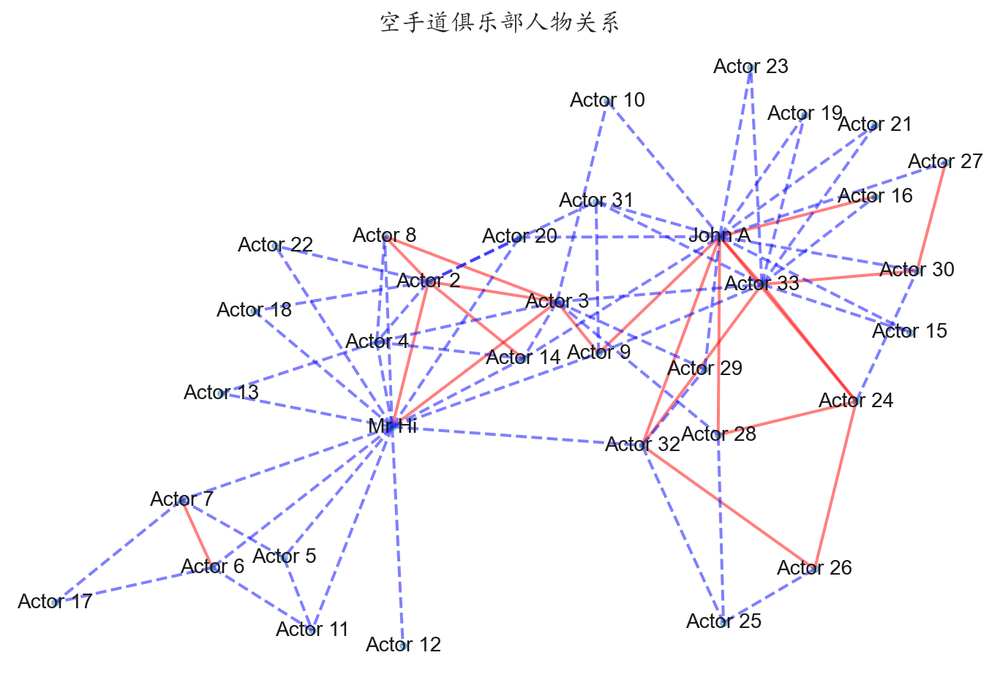

In [48]:
## 网络图数据可视化
plt.figure(figsize=(12,8))
## 生成社交网络图
G=nx.Graph()

## 为图像添加边
for ii in karate.index:
    G.add_edge(karate.From[ii],karate.to[ii],weight = karate.weight[ii])
    
## 根据权重大小定义2种边
elarge=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] > 3.5]
esmall=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] < 3.5]

## 图的布局方式
pos=graphviz_layout(G,prog="fdp")
# pos=nx.circular_layout(G)

# 可视化图的节点
nx.draw_networkx_nodes(G,pos,alpha=0.4,node_size=20)

# 可视化图的边
nx.draw_networkx_edges(G,pos,edgelist=elarge,
                       width=2,alpha=0.5,edge_color= "red")
nx.draw_networkx_edges(G,pos,edgelist=esmall,
                       width=2,alpha=0.5,edge_color="blue",style='dashed')

# 为节点添加标签
nx.draw_networkx_labels(G,pos,font_size = 14)
plt.axis('off')
plt.title("空手道俱乐部人物关系")
plt.show() 


In [49]:
## 地图数据
from vega_datasets import data
states = alt.topo_feature(data.us_10m.url, feature='states')
## 机场位置和数量数据
airports = pd.read_csv("data/chap2/airports.csv")
airports = airports.groupby("state").agg(latitude = ("latitude",np.mean),
                                         longitude = ("longitude",np.mean),
                                         number = ("state",np.size))
airports["state2"] = airports.index.values
print(airports.head())

        latitude   longitude  number state2
state                                      
AK     61.334311 -152.687173     263     AK
AL     32.633309  -86.769922      73     AL
AR     35.073206  -92.236676      74     AR
AS     14.243716 -169.934818       3     AS
AZ     34.000364 -111.494723      59     AZ


In [50]:
## 地图数据可视化

## 气泡地图

## 美国地图背景
background = alt.Chart(states).mark_geoshape(
    fill="lightblue",stroke="white"
).properties(width=500,height=300
).project("albersUsa")

## 机场的位置和气泡
points = alt.Chart(airports).mark_circle().encode(
    longitude="longitude:Q",
    latitude="latitude:Q",
    size=alt.Size("number:Q", title="机场数量"),
    color=alt.value("red"),
    tooltip=["state2:N","number:Q"]
).properties(
    title="美国机场数量")
## 可视化背景和点
background + points


alt.LayerChart(...)

### 2.4 数据样本间的距离

In [51]:
## 使用计算距离的数据
datadf = pd.read_csv("data/chap2/种子数据.csv")
datadf2 = datadf.iloc[:,0:7]
print(datadf2.head())

      x1     x2      x3     x4     x5     x6     x7
0  15.26  14.84  0.8710  5.763  3.312  2.221  5.220
1  14.88  14.57  0.8811  5.554  3.333  1.018  4.956
2  14.29  14.09  0.9050  5.291  3.337  2.699  4.825
3  13.84  13.94  0.8955  5.324  3.379  2.259  4.805
4  16.14  14.99  0.9034  5.658  3.562  1.355  5.175


In [52]:
## 计算样本的距离
from scipy.spatial import distance

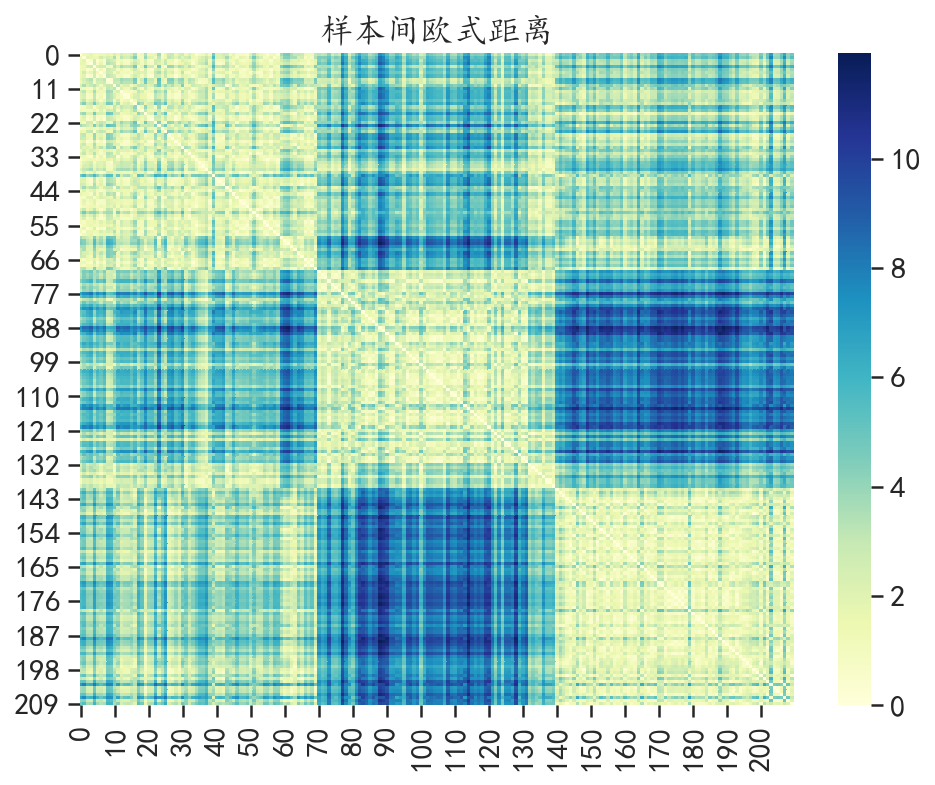

In [53]:
## 欧式距离
dist = distance.cdist(datadf2,datadf2,"euclidean")
## 使用热力图可视化样本之间的距离
plt.figure(figsize=(8,6))
sns.heatmap(dist,cmap="YlGnBu")
plt.title("样本间欧式距离")
plt.show()

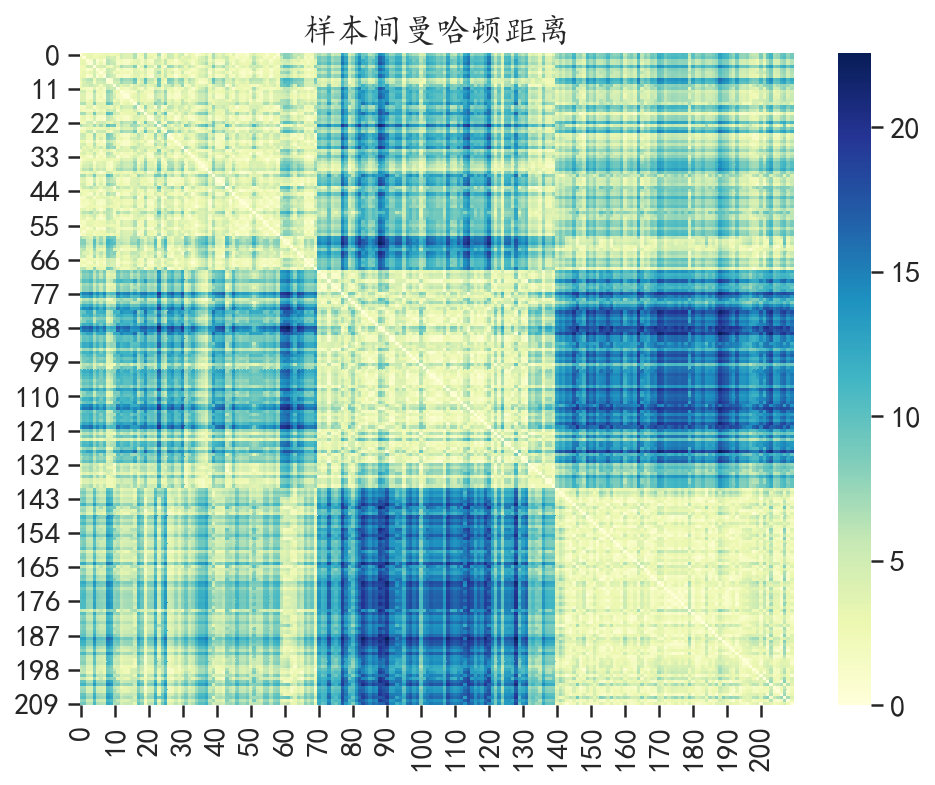

In [54]:
## 曼哈顿距离
dist = distance.cdist(datadf2,datadf2,"cityblock")
## 使用热力图可视化样本之间的距离
plt.figure(figsize=(8,6))
sns.heatmap(dist,cmap="YlGnBu")
plt.title("样本间曼哈顿距离")
plt.show()

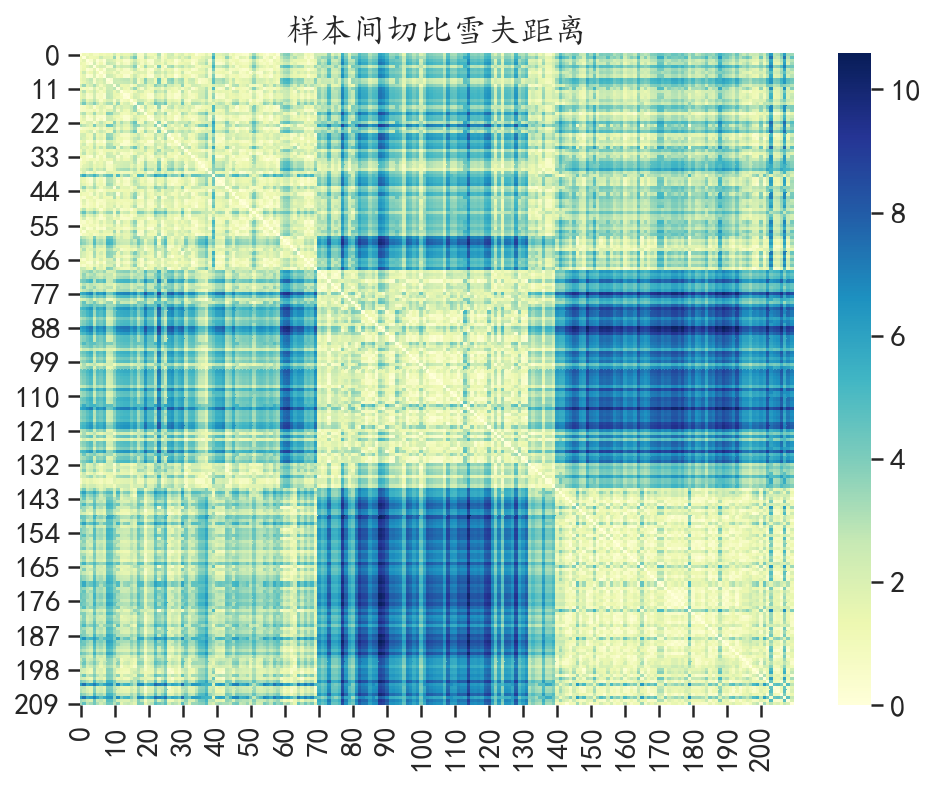

In [55]:
## 切比雪夫距离
dist = distance.cdist(datadf2,datadf2,"chebyshev")
## 使用热力图可视化样本之间的距离
plt.figure(figsize=(8,6))
sns.heatmap(dist,cmap="YlGnBu")
plt.title("样本间切比雪夫距离")
plt.show()

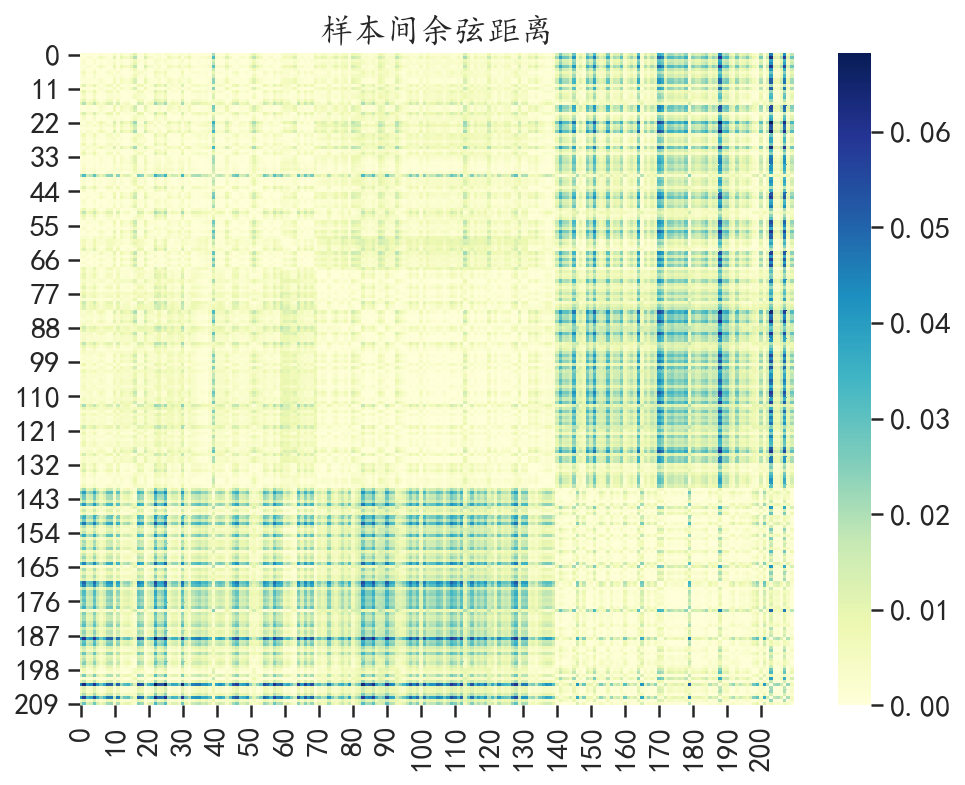

In [56]:
## 余弦距离
dist = distance.cdist(datadf2,datadf2,"cosine")
## 使用热力图可视化样本之间的距离
plt.figure(figsize=(8,6))
sns.heatmap(dist,cmap="YlGnBu")
plt.title("样本间余弦距离")
plt.show()

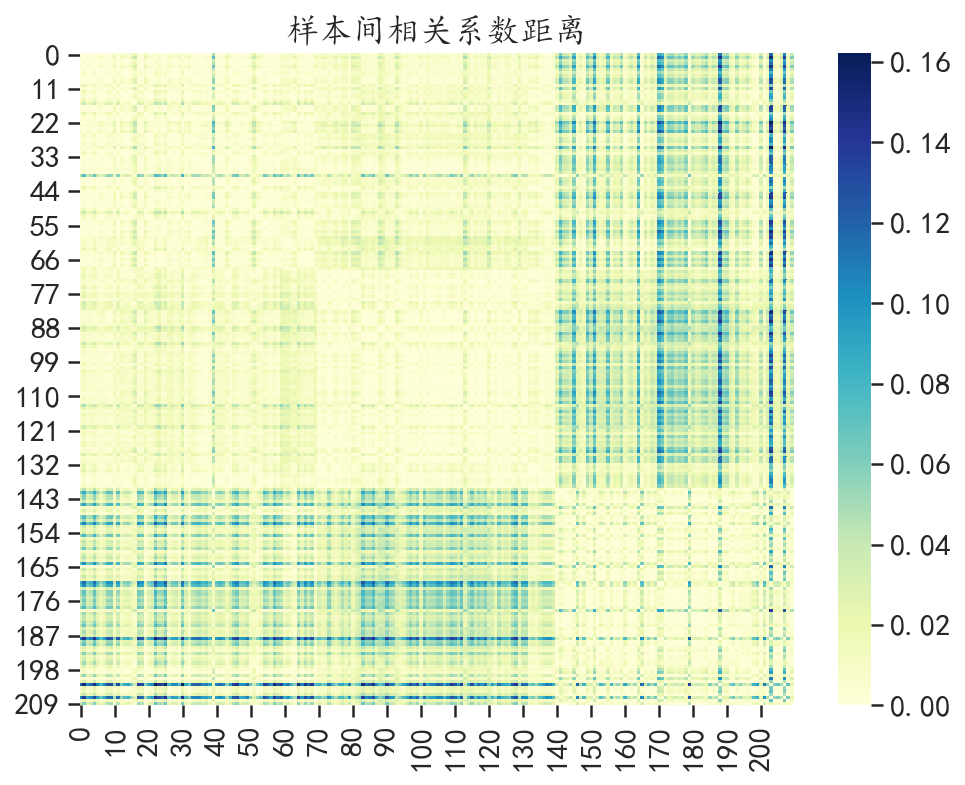

In [57]:
## 相关系数距离
dist = distance.cdist(datadf2,datadf2,"correlation")
## 使用热力图可视化样本之间的距离
plt.figure(figsize=(8,6))
sns.heatmap(dist,cmap="YlGnBu")
plt.title("样本间相关系数距离")
plt.show()

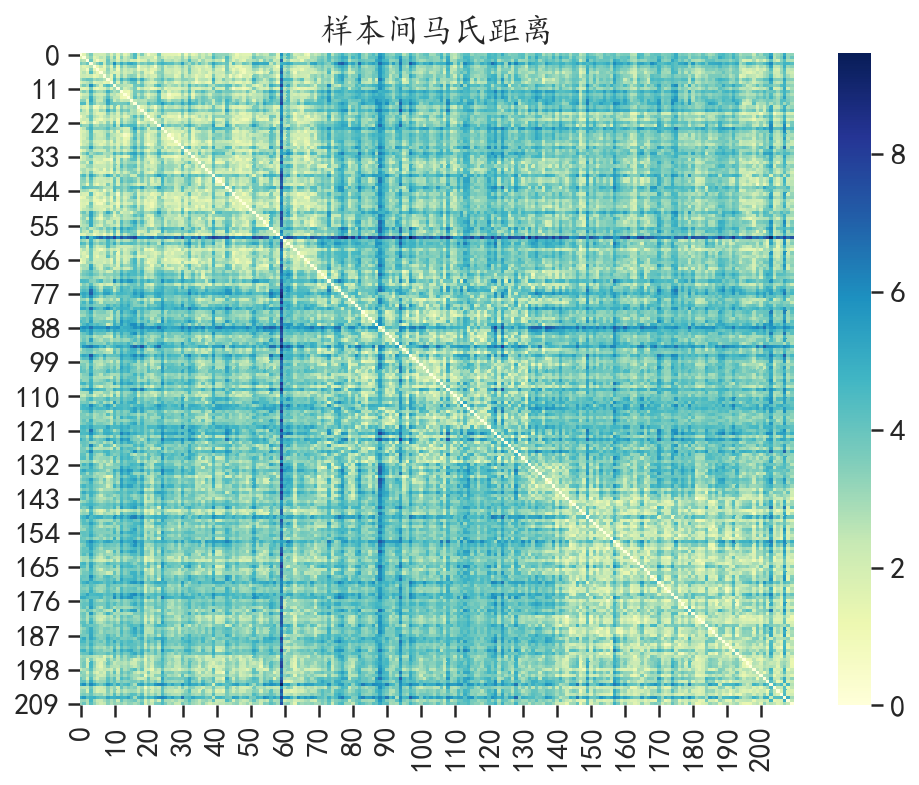

In [58]:
## 马氏距离
dist = distance.cdist(datadf2,datadf2,"mahalanobis")
## 使用热力图可视化样本之间的距离
plt.figure(figsize=(8,6))
sns.heatmap(dist,cmap="YlGnBu")
plt.title("样本间马氏距离")
plt.show()